# Watermarks Removal with Convolutional Encodeur

In [1]:
import numpy as np 
import matplotlib.pyplot as plt 
import os 
import tensorflow as tf 
from keras.models import Model
from keras.layers import Conv2D, MaxPooling2D, Input, Conv2D, UpSampling2D, BatchNormalization
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping
import cv2
from sklearn.model_selection import train_test_split
import random

img path

In [55]:
train_path = os.path.join('data/dataset/train')
valid_path = os.path.join('data/dataset/valid')

vérifier le nom des fichiers

In [56]:
def takeFileName(filedir):
    filename = np.array(filedir.split('/'))[-1]
    return filename

In [57]:
def matchFileNames(watermarkedarr, nonwatermarkedarr, dname_wm, dname_nwm):
    sortedwmarr = np.array([])
    sortednwmarr = np.array([])
    
    wmarr = list(watermarkedarr)
    nwmarr = list(nonwatermarkedarr)
    
    length = len(watermarkedarr) if len(watermarkedarr) >= len(nonwatermarkedarr) else len(nonwatermarkedarr)
    
    for pos in range(length):
        try:
            if length == len(watermarkedarr):
                exist_nwm = nwmarr.index(wmarr[pos])
                sortedwmarr = np.append(sortedwmarr, dname_wm + watermarkedarr[pos])
                sortednwmarr = np.append(sortednwmarr, dname_nwm + nonwatermarkedarr[exist_nwm]) 
            elif length == len(nonwatermarkedarr):
                exist_wm = wmarr.index(nwmarr[pos])
                sortedwmarr = np.append(sortedwmarr, dname_wm + watermarkedarr[exist_wm])
                sortednwmarr = np.append(sortednwmarr, dname_nwm + nonwatermarkedarr[pos])
        except ValueError: 
            continue
    return sortedwmarr, sortednwmarr

In [58]:
train_path_watermarked_images = os.path.join('data/dataset/train/watermarked/')
train_path_normal_images = os.path.join('data/dataset/train/normal/')

tp_watermarked = np.array([]) 
tp_nonwatermarked = np.array([])

for root, dirs, files in os.walk(train_path_watermarked_images, topdown=True): 
    for file in files:
        tp_watermarked = np.append(tp_watermarked, takeFileName(file))
    
for root, dirs, files in os.walk(train_path_normal_images, topdown=True):
    for file in files:
        tp_nonwatermarked = np.append(tp_nonwatermarked, takeFileName(file))
        
tp_watermarked_sorted, tp_nonwatermarked_sorted = matchFileNames(tp_watermarked, tp_nonwatermarked, train_path_watermarked_images, train_path_normal_images)

valid_path_watermarked_images = os.path.join('data/dataset/valid/watermarked/')
valid_path_nonwatermarked_images = os.path.join('data/dataset/valid/normal/')

vp_watermarked = np.array([])
vp_nonwatermarked = np.array([])

for root, dirs, files in os.walk(valid_path_watermarked_images, topdown=True):
    for file in files:
        vp_watermarked = np.append(vp_watermarked, takeFileName(file))
    
for root, dirs, files in os.walk(valid_path_nonwatermarked_images, topdown=True):
    for file in files:
        vp_nonwatermarked = np.append(vp_nonwatermarked, takeFileName(file))
        
vp_watermarked_sorted, vp_nonwatermarked_sorted = matchFileNames(vp_watermarked, vp_nonwatermarked, valid_path_watermarked_images, valid_path_nonwatermarked_images)

rescale les images

In [59]:
width = 196 
height = 196
dim = (width, height)

def createPixelArr(files):
    data = []
    for image in files:
        try: 
            img_arr = cv2.imread(image, cv2.IMREAD_COLOR)
            if img_arr is None:
                print('Image is none')
                continue
            
            resized_arr = cv2.resize(img_arr, (width, height))
            data.append(resized_arr) 
        except Exception as e:
            print('Erreur :', e)
    return np.array(data)

train_wms_pixVals = createPixelArr(tp_watermarked_sorted)
train_nwms_pixVals = createPixelArr(tp_nonwatermarked_sorted)

val_wms_pixVals = createPixelArr(vp_watermarked_sorted)
val_nwms_pixVals = createPixelArr(vp_nonwatermarked_sorted)

In [60]:
print(f"Nombre d'images dans tp_watermarked_sorted: {len(tp_watermarked_sorted)}")
print(f"Nombre d'images dans tp_nonwatermarked_sorted: {len(tp_nonwatermarked_sorted)}")
print(f"Nombre d'images dans vp_watermarked_sorted: {len(vp_watermarked_sorted)}")
print(f"Nombre d'images dans vp_nonwatermarked_sorted: {len(vp_nonwatermarked_sorted)}")

Nombre d'images dans tp_watermarked_sorted: 1731
Nombre d'images dans tp_nonwatermarked_sorted: 1731
Nombre d'images dans vp_watermarked_sorted: 433
Nombre d'images dans vp_nonwatermarked_sorted: 433


In [61]:
assert train_wms_pixVals.shape[1:] == (196, 196, 3), "Erreur : Dimensions inattendues dans train_wms_pixVals"
assert train_nwms_pixVals.shape[1:] == (196, 196, 3), "Erreur : Dimensions inattendues dans train_nwms_pixVals"

jeux de test et entrainement

In [62]:
X_train, X_test, y_train, y_test = train_test_split(train_wms_pixVals, train_nwms_pixVals, train_size=0.8, random_state=1) 

In [63]:
train_wms_pixVals = 0 
train_nwms_pixVals = 0 
val_wms_pixVals = 0 
val_nwms_pixVals = 0 

## Data augmentation

In [64]:
def data_augmentation(inputImage): # run image through all augmentation methods
    return randomContrast(randomBrightness(inputImage)).numpy()

def randomFlip(pic): # flips the image up and down before left and right at random
    return tf.image.random_flip_up_down(tf.image.random_flip_left_right(pic, 1), 1)

def randomBrightness(pic): # makes the image a random brightness from 1% to 20%
    return tf.image.random_brightness(pic, random.uniform(0.01, 0.2), 1)

def randomContrast(pic): # contrasts the image from 5% to 50%
    return tf.image.random_contrast(pic, 0.2, 0.7, 1)

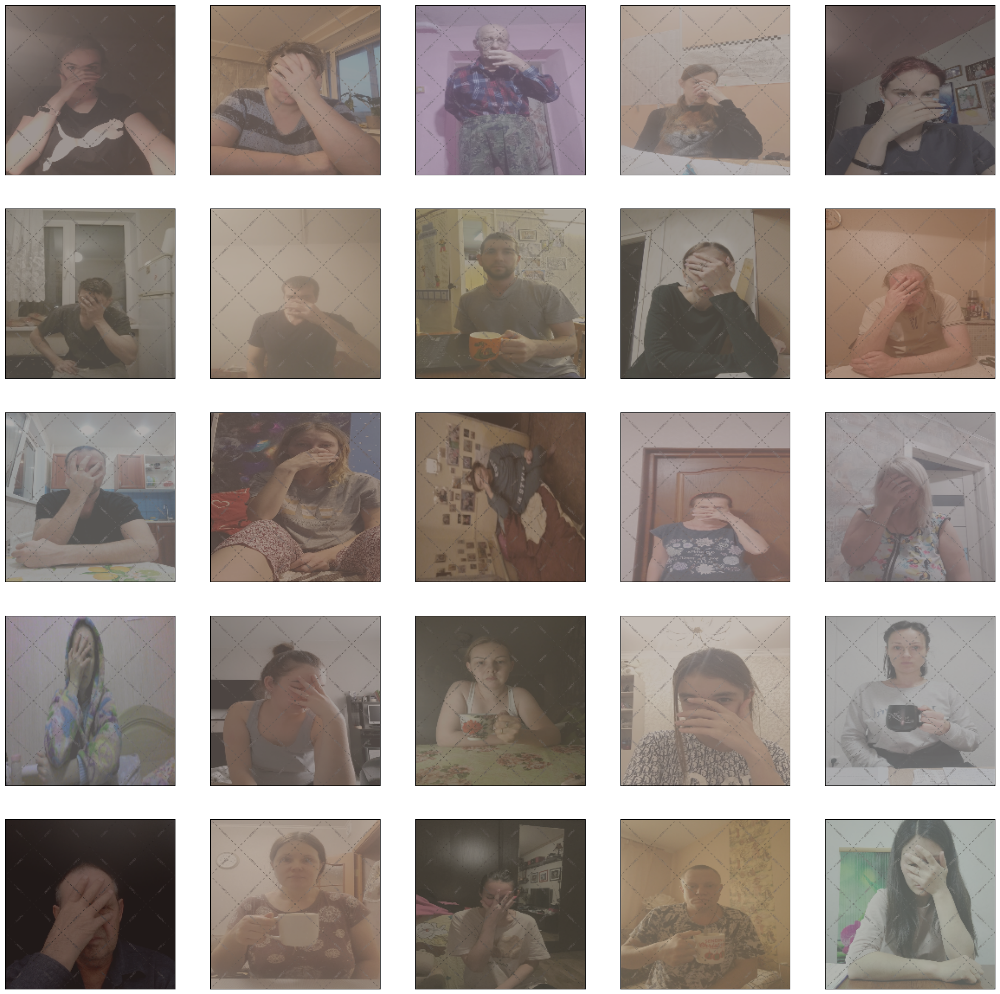

In [ ]:
plt.figure(figsize=(25,25))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    augmented_image = data_augmentation(X_train[random.randint(0, len(X_train) - 1)])
    plt.imshow(cv2.cvtColor(augmented_image, cv2.COLOR_BGR2RGB)) 
plt.show()

In [66]:
data_augmented_X = [] 
data_augmented_y = []

for image in X_train:
    data_augmented_X.append(data_augmentation(image))
    
for image in y_train:
    data_augmented_y.append(data_augmentation(image))

In [69]:
X_train = np.append(X_train, data_augmented_X, axis=0)
y_train = np.append(y_train, data_augmented_y, axis=0)

normalisation

In [70]:
X_train = X_train / 255
y_train = y_train / 255
X_test = X_test / 255
y_test = y_test / 255

assert len(X_train) == len(y_train), "Mismatch in number of samples between X_train and y_train"
assert len(X_test) == len(y_test), "Mismatch in number of samples between X_test and y_test"

In [71]:
print("Dimensions des images :")
print(f"X_train: {X_train.shape}")
print(f"y_train: {y_train.shape}")

assert X_train.shape[1:] == (width, height, 3), "Les dimensions de X_train ne correspondent pas au modèle"
assert y_train.shape[1:] == (width, height, 3), "Les dimensions de y_train ne correspondent pas au modèle"

Dimensions des images :
X_train: (2768, 196, 196, 3)
y_train: (2768, 196, 196, 3)


In [72]:
for i, img in enumerate(X_train):
    if img is None:
        print(f"Image invalide à l'index {i}")

## Modèle encodeur CNN

In [73]:
def create_model(img_x, img_y):
    x = Input(shape=(img_x, img_y, 3))
    
    # Encoder - compresse l'image en une représentation latente
    e_conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    pool1 = MaxPooling2D((2, 2), padding='same')(e_conv1)
    batchnorm_1 = BatchNormalization()(pool1)
    
    e_conv2 = Conv2D(32, (3, 3), activation='relu', padding='same')(batchnorm_1)
    pool2 = MaxPooling2D((2, 2), padding='same')(e_conv2)
    batchnorm_2 = BatchNormalization()(pool2)
    
    e_conv3 = Conv2D(16, (3, 3), activation='relu', padding='same')(batchnorm_2)
    h = MaxPooling2D((2, 2), padding='same')(e_conv3)
    
    # Decoder - reconstruit l'image à partir de la représentation latente
    d_conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(h)
    up1 = UpSampling2D((2, 2))(d_conv1)
    
    d_conv2 = Conv2D(32, (3, 3), activation='relu', padding='same')(up1)
    up2 = UpSampling2D((2, 2))(d_conv2)
    
    d_conv3 = Conv2D(16, (3, 3), activation='relu')(up2)
    up3 = UpSampling2D((2, 2))(d_conv3)
    
    r = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(up3)
    
    model = Model(x, r)
    model.compile(optimizer=Adam(learning_rate=0.0005), loss='mse')
    return model

## Entrainement

In [74]:
batch_size = 20
epochs = 25

In [ ]:
watermark_auto_encoder = create_model(width, height)
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

with tf.device('/device:GPU:0'): # utilisations du GPU 
    history = watermark_auto_encoder.fit(X_train, y_train, batch_size=batch_size, epochs=epochs, validation_split=0.2, callbacks=[early_stop], verbose=1)

Epoch 1/50
111/111 ━━━━━━━━━━━━━━━━━━━━ 158s 1s/step - loss: 0.0193 - val_loss: 0.0211
Epoch 2/50
111/111 ━━━━━━━━━━━━━━━━━━━━ 158s 1s/step - loss: 0.0075 - val_loss: 0.0178
Epoch 3/50
111/111 ━━━━━━━━━━━━━━━━━━━━ 155s 1s/step - loss: 0.0058 - val_loss: 0.0119
Epoch 4/50
111/111 ━━━━━━━━━━━━━━━━━━━━ 155s 1s/step - loss: 0.0055 - val_loss: 0.0070
Epoch 5/50
111/111 ━━━━━━━━━━━━━━━━━━━━ 156s 1s/step - loss: 0.0052 - val_loss: 0.0025
Epoch 6/50
111/111 ━━━━━━━━━━━━━━━━━━━━ 159s 1s/step - loss: 0.0051 - val_loss: 0.0022
Epoch 7/50
111/111 ━━━━━━━━━━━━━━━━━━━━ 159s 1s/step - loss: 0.0048 - val_loss: 0.0023
Epoch 8/50
111/111 ━━━━━━━━━━━━━━━━━━━━ 175s 2s/step - loss: 0.0050 - val_loss: 0.0018
Epoch 9/50
111/111 ━━━━━━━━━━━━━━━━━━━━ 154s 1s/step - loss: 0.0048 - val_loss: 0.0030
Epoch 10/50
111/111 ━━━━━━━━━━━━━━━━━━━━ 158s 1s/step - loss: 0.0048 - val_loss: 0.0018
Epoch 11/50
111/111 ━━━━━━━━━━━━━━━━━━━━ 159s 1s/step - loss: 0.0045 - val_loss: 0.0020
Epoch 12/50
111/111 ━━━━━━━━━━━━━━━━━━━━ 

In [81]:
# enregistrer le modèle 
watermark_auto_encoder.save('models/cnn_encoder.h5')

## Visualisation

In [76]:
result = watermark_auto_encoder.predict(X_test)
watermark_auto_encoder.evaluate(X_test, result)

11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0000e+00


0.0

input images

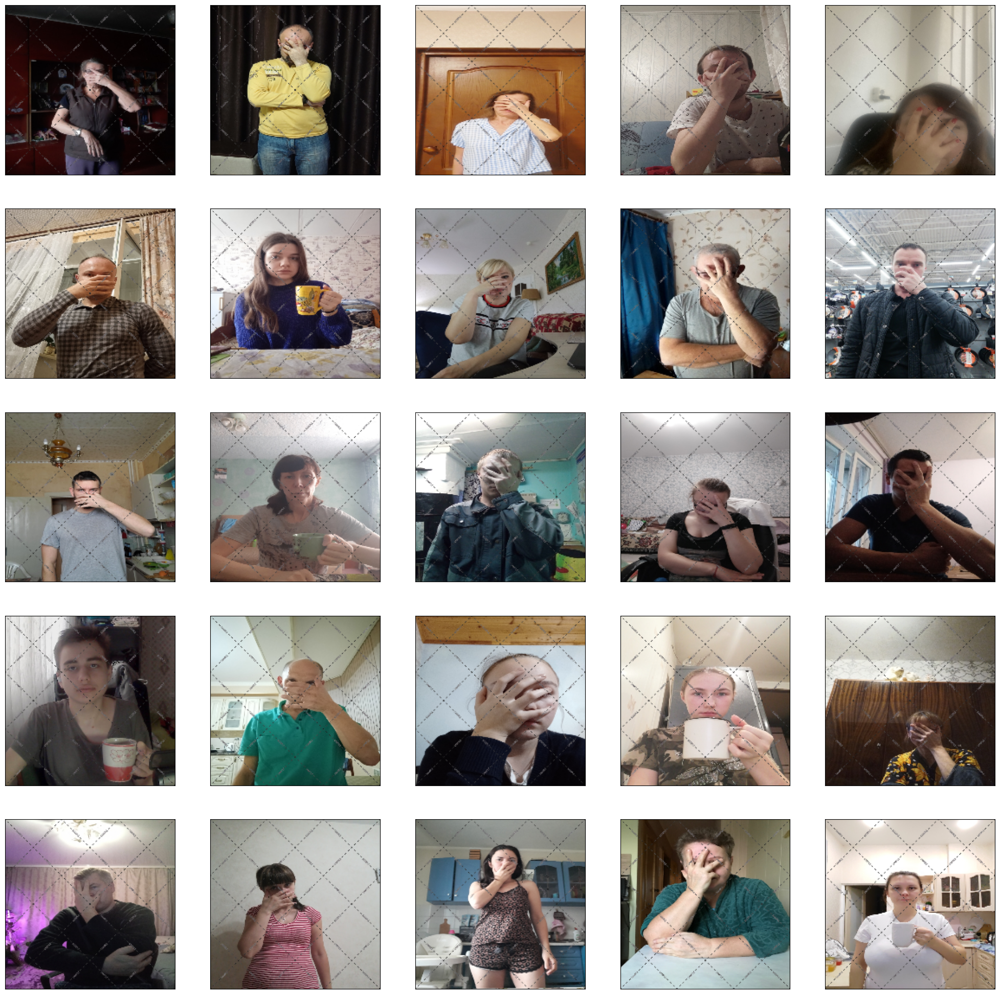

In [78]:
plt.figure(figsize=(25,25))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(cv2.cvtColor(X_test[i].astype('float32'), cv2.COLOR_BGR2RGB))
plt.show()

output images

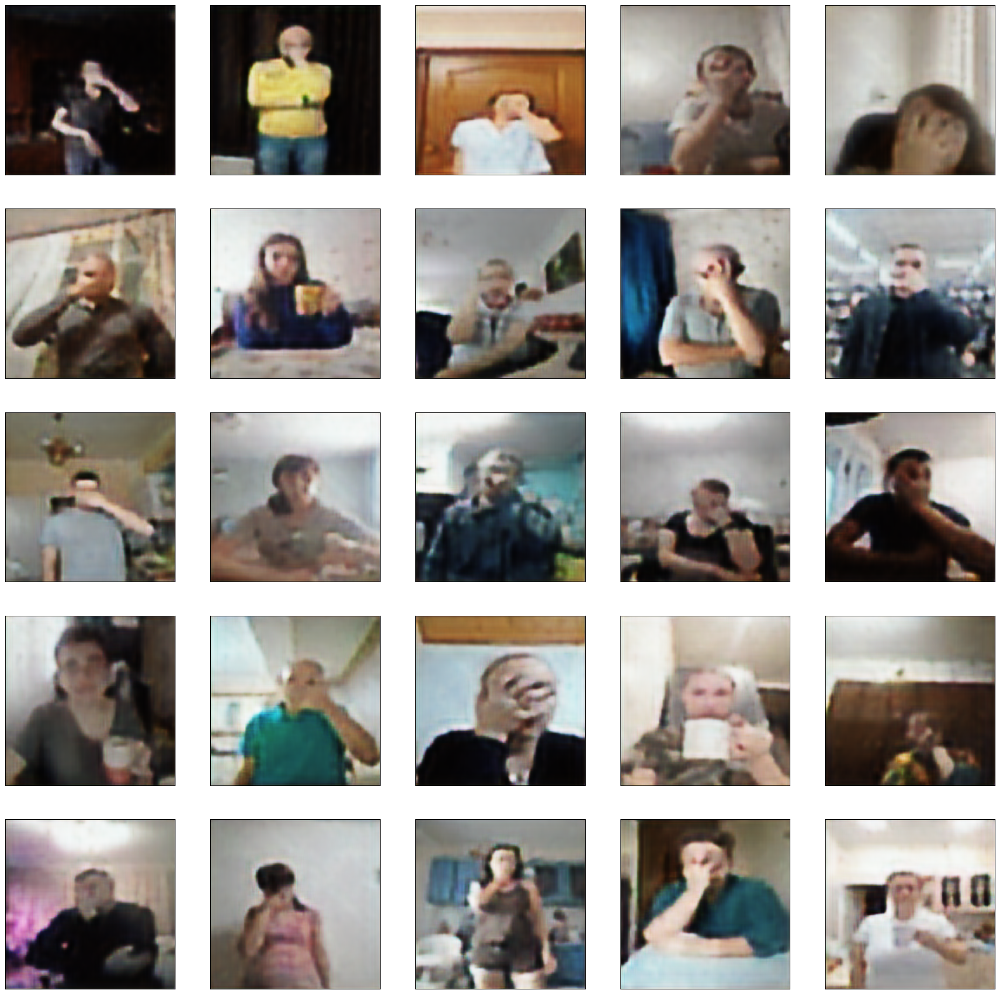

In [79]:
plt.figure(figsize=(25,25))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(cv2.cvtColor(result[i], cv2.COLOR_BGR2RGB))
plt.show()